<a href="https://colab.research.google.com/github/fatemesima/Vision/blob/main/EfficientNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Tue Nov  5 15:06:49 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets, transforms
from torchvision.models import resnet18, resnet34
import os

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
!git clone https://github.com/NVIDIA/apex

fatal: destination path 'apex' already exists and is not an empty directory.


In [5]:
cd apex

/content/apex


In [6]:
!pip install -v --disable-pip-version-check --no-build-isolation --no-cache-dir ./


Using pip 24.3.1 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)
Processing /content/apex
  Running command Preparing metadata (pyproject.toml)


  torch.__version__  = 2.5.0+cu121


  running dist_info
  creating /tmp/pip-modern-metadata-c59e80e0/apex.egg-info
  writing /tmp/pip-modern-metadata-c59e80e0/apex.egg-info/PKG-INFO
  writing dependency_links to /tmp/pip-modern-metadata-c59e80e0/apex.egg-info/dependency_links.txt
  writing requirements to /tmp/pip-modern-metadata-c59e80e0/apex.egg-info/requires.txt
  writing top-level names to /tmp/pip-modern-metadata-c59e80e0/apex.egg-info/top_level.txt
  writing manifest file '/tmp/pip-modern-metadata-c59e80e0/apex.egg-info/SOURCES.txt'
  reading manifest file '/tmp/pip-modern-metadata-c59e80e0/apex.egg-info/SOURCES.txt'
  adding license file 'LICENSE'
  writing manifest file '/tmp/pip-modern-metadata-c59e80e0/apex.egg-info/SOURCES.txt'
  creating '/tmp/pip-modern-metadata-c59e80e0/apex-0.1.dist-info'
  Preparing metadata (p

In [7]:
cd ..

/content


In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
cp /content/drive/MyDrive/Data/CUB_200_2011.tgz /content/

In [10]:
!tar -xvxf CUB_200_2011.tgz

Streaming output truncated to the last 5000 lines.
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0050_111087.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0079_113288.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0004_111989.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0068_113247.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0127_111935.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0094_112773.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0028_113217.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0126_110959.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0007_111029.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0096_111519.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0120_113001.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0010_112678.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0025_111669.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0084_111300.j

In [11]:
import shutil

In [12]:
data_dir = '/content/CUB_200_2011/'
images_dir = os.path.join(data_dir, 'images')

train_dir = os.path.join(data_dir, 'train')
os.makedirs(train_dir, exist_ok=True)
test_dir = os.path.join(data_dir, 'test')
os.makedirs(test_dir, exist_ok=True)

classes = os.listdir(images_dir)

with open('/content/CUB_200_2011/images.txt') as f:
  image_names = f.readlines()

with open('/content/CUB_200_2011/train_test_split.txt') as f:
  train_test_split = f.readlines()

for train_idx, image_name in zip(train_test_split, image_names):
  num, class_image_name = image_name.split()
  image_idx, train_flag = train_idx.split()
  image_path = os.path.join(images_dir, class_image_name)
  class_name = class_image_name.split('/')[0]
  train_class_dir = os.path.join(train_dir, class_name)
  os.makedirs(train_class_dir, exist_ok=True)
  test_class_dir = os.path.join(test_dir, class_name)
  os.makedirs(test_class_dir, exist_ok=True)
  if train_flag == '0':
    shutil.copy(image_path, train_class_dir)
  else:
    shutil.copy(image_path, test_class_dir)

In [48]:
# Data
transform_train = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomApply([
      transforms.ColorJitter(0.4, 0.4, 0.4, 0.1)], p=0.8
    ),
    transforms.RandomGrayscale(0.2),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

# trainset = torchvision.datasets.CIFAR100(
#     root='./data', train=True, download=True, transform=transform_train)
trainset = datasets.ImageFolder(root='/content/CUB_200_2011/train/',
                                transform=transform_train)
trainloader = torch.utils.data.DataLoader(
    trainset, batch_size=128, shuffle=False, num_workers=2)

# testset = torchvision.datasets.CIFAR100(
#     root='./data', train=False, download=True, transform=transform_test)
testset = datasets.ImageFolder(root='/content/CUB_200_2011/test/',
                                transform=transform_test)
testloader = torch.utils.data.DataLoader(
    testset, batch_size=100, shuffle=False, num_workers=2)

In [14]:
trainloader

In [15]:
batch = next(iter(trainloader))
batch[0].shape, batch[1].shape

(torch.Size([128, 3, 224, 224]), torch.Size([128]))

In [16]:
import numpy as np
import matplotlib.pyplot as plt

def normalize_image(image):
    image_min = image.min()
    image_max = image.max()
    image.clamp_(min = image_min, max = image_max)
    image.add_(-image_min).div_(image_max - image_min + 1e-5)
    return image

def plot_images(images, labels, classes, normalize=True):

    n_images = len(images)

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize=(20, 20))

    for i in range(rows*cols):

        ax = fig.add_subplot(rows, cols, i+1)

        image = images[i]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.permute(1, 2, 0).cpu().numpy())
        ax.set_title(classes[labels[i]])
        ax.axis('off')

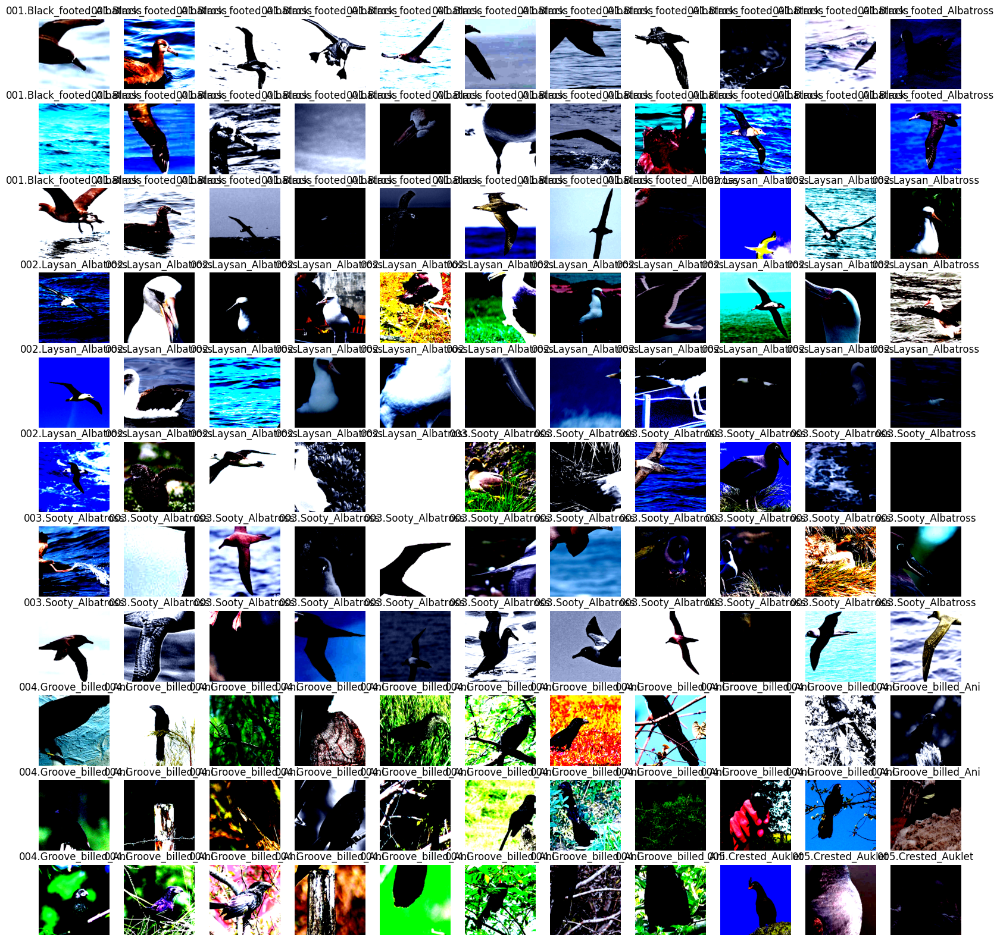

In [17]:
classes = trainset.classes

plot_images(batch[0], batch[1], classes, normalize=False)

In [18]:
from torch.utils.data import Dataset, DataLoader

In [19]:
class TwoCropTransform:
    """Create two crops of the same image"""
    def __init__(self, transform):
        self.transform = transform

    def __call__(self, x):
        return [self.transform(x), self.transform(x)]

In [20]:
class CUBDataset(Dataset):
  def __init__(self, phase):
    self.dataset = datasets.ImageFolder(root=f'/content/CUB_200_2011/{phase}/',
                                transform=transform_train)
    tr = TwoCropTransform(transform_train)
    # self.bbxs = []
  def __getitem__(self, item):
    img_tuple = self.dataset.imgs[item]
    label = img_tuple[1]
    img = self.dataset.loader(img_tuple[0])
    img1, img2 = tr(img)
    item2 = torch.randint(len(self.dataset))
    self.dataset.imgs[item2]
    # patch = img[self.bbxs[item][0]:self.bbxs[item][2], self.bbxs[item][1]:self.bbxs[item][3]]
    return patch, label

  def __len__(self):
    return len(self.dataset)

In [21]:
phase = 'train'
dataset = datasets.ImageFolder(root=f'/content/CUB_200_2011/{phase}/',
                                transform=transform_train)

In [22]:
trainset = CUBDataset(phase='train')
trainloader = torch.utils.data.DataLoader(
    trainset, batch_size=128, shuffle=False, num_workers=2)

In [23]:
batch = next(iter(testloader))
train_data = batch[0]

In [24]:
pip install efficientnet_pytorch

In [25]:
from efficientnet_pytorch import EfficientNet
net = EfficientNet.from_pretrained('efficientnet-b0')

Loaded pretrained weights for efficientnet-b0


In [26]:
net._fc = nn.Linear(1280, 200)

In [27]:
net.to(device)

EfficientNet(
  (_conv_stem): Conv2dStaticSamePadding(
    3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
    (static_padding): ZeroPad2d((0, 1, 0, 1))
  )
  (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
  (_blocks): ModuleList(
    (0): MBConvBlock(
      (_depthwise_conv): Conv2dStaticSamePadding(
        32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
        (static_padding): ZeroPad2d((1, 1, 1, 1))
      )
      (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
      (_se_reduce): Conv2dStaticSamePadding(
        32, 8, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_se_expand): Conv2dStaticSamePadding(
        8, 32, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_project_conv): Conv2dStaticSamePadding(
        32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False
    

In [28]:
def count_parameters(model):
    params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return params/1000000

In [29]:
count_parameters(net)

4.263748

In [30]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.1,
                      momentum=0.9)

In [31]:
y = net(batch[0].to(device))

In [32]:
criterion(y, batch[1].to(device))

tensor(5.3196, device='cuda:0', grad_fn=<NllLossBackward0>)

In [34]:
FOUND_LR = 1e-3
model = net
params = [
          {'params': net._conv_stem.parameters(), 'lr': FOUND_LR / 10},
          {'params': model._bn0.parameters(), 'lr': FOUND_LR / 10},
          {'params': model._blocks.parameters(), 'lr': FOUND_LR / 8},
          {'params': model._conv_head.parameters(), 'lr': FOUND_LR / 6},
         ]


optimizer = optim.Adam(params, lr = FOUND_LR)

In [35]:
from torch.utils.tensorboard import SummaryWriter
import numpy as np

In [36]:
try:
    from google import colab
    COLAB_ENV = True
except (ImportError, ModuleNotFoundError):
    COLAB_ENV = False

# Load the TensorBoard notebook extension
if COLAB_ENV:
    %load_ext tensorboard
    %tensorboard --logdir runs  --host localhost --port 8088
else:
    print("To use tensorboard, please use this notebook in a Google Colab environment.")

<IPython.core.display.Javascript object>

In [37]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [38]:
pip install torchmetrics

In [39]:
import logging
logging.getLogger().setLevel(logging.INFO)
logger = logging.getLogger('CUB_200_2011')
logger.info('This is an info message')
logging.warning('This is a warning message')
logging.error('This is an error message')
logging.critical('This is a critical message')

INFO:CUB_200_2011:This is an info message
ERROR:root:This is an error message
CRITICAL:root:This is a critical message


In [40]:
import sys
import torchmetrics
import logging
logger = logging.getLogger('200class')
writer = SummaryWriter('runs/CUB_200_2011_EfficientNet')
writer = SummaryWriter()

In [41]:
import apex
import apex.amp as amp

In [42]:
net , optimizer = amp.initialize(net , optimizers= optimizer , opt_level = 'O2' )

Selected optimization level O2:  FP16 training with FP32 batchnorm and FP32 master weights.

Defaults for this optimization level are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic
Processing user overrides (additional kwargs that are not None)...
After processing overrides, optimization options are:
enabled                : True
opt_level              : O2
cast_model_type        : torch.float16
patch_torch_functions  : False
keep_batchnorm_fp32    : True
master_weights         : True
loss_scale             : dynamic


/usr/local/lib/python3.10/dist-packages/apex/__init__.py:68: DeprecatedFeatureWarning: apex.amp is deprecated and will be removed by the end of February 2023. Use [PyTorch AMP](https://pytorch.org/docs/stable/amp.html)
  warnings.warn(msg, DeprecatedFeatureWarning)
/usr/local/lib/python3.10/dist-packages/apex/amp/scaler.py:56: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:78.)
  self._overflow_buf = torch.cuda.IntTensor([0])


In [43]:
# Training
def train(epoch):
    epoch
    net.train()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task="multiclass",num_classes=200).cuda()
    for batch_idx, (inputs, targets) in enumerate(trainloader):
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = net(inputs)
        loss = criterion(outputs, targets)
        with amp.scale_loss(loss , optimizer) as scale_loss:
          scale_loss.backward()
        #loss.backward()
        optimizer.step()
        loss_total.update(loss)
        accuracy(outputs.softmax(dim=-1), targets)
        # print(targets[:10])
        # if batch_idx == 5:
        #     break
    acc = accuracy.compute()
    writer.add_scalar('Loss/train', loss_total.avg.item(), epoch)
    writer.add_scalar('Acc/train', acc.item(), epoch)
    logger.info(f'Train: Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')


def test(epoch, checkpoint):
    epoch
    net.eval()
    loss_total = AverageMeter()
    accuracy = torchmetrics.Accuracy(task="multiclass",num_classes=200).cuda()
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(testloader):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = net(inputs)
            loss = criterion(outputs, targets)
            loss_total.update(loss)
            accuracy(outputs.softmax(dim=-1), targets)
        acc = accuracy.compute()
        writer.add_scalar('Loss/test', loss_total.avg.item(), epoch)
        writer.add_scalar('Acc/test', acc.item(), epoch)
        logger.info(f'Test:  Epoch:{epoch} Loss:{loss_total.avg:.4} Accuracy:{acc:.4}')
        print()
    # Save checkpoint
    checkpoint.save(accuracy.compute(), 'ckpt', epoch=epoch)


class Checkpoint(object):
    def __init__(self):
        self.best_acc = 0.
        self.folder = 'chekpoint'
        os.makedirs(self.folder, exist_ok=True)
    def save(self, acc, filename, epoch=-1):
        if acc > best_acc:
            logger.info('Saving checkpoint...')
            state = {
                'net': net.state_dict(),
                'acc': acc,
                'epoch': epoch,
            }
            path = os.path.join(os.path.abspath(self.folder), filename + '.pth')
            torch.save(state, path)
            self.best_acc = acc
    def load(self, net):
        pass

In [49]:
checkpoint = Checkpoint()
start, end = 0, 1
for epoch in range(start, end):
    train(epoch)

writer.close()

INFO:200class:Train: Epoch:0 Loss:5.325 Accuracy:0.005005


In [50]:
checkpoint = Checkpoint()
start, end = 0, 50
for epoch in range(start, end):
    train(epoch)

writer.close()

INFO:200class:Train: Epoch:0 Loss:5.28 Accuracy:0.009838
INFO:200class:Train: Epoch:1 Loss:5.242 Accuracy:0.01622
INFO:200class:Train: Epoch:2 Loss:5.199 Accuracy:0.02865
INFO:200class:Train: Epoch:3 Loss:5.15 Accuracy:0.04401
INFO:200class:Train: Epoch:4 Loss:5.101 Accuracy:0.06282
INFO:200class:Train: Epoch:5 Loss:5.037 Accuracy:0.08405
INFO:200class:Train: Epoch:6 Loss:4.965 Accuracy:0.1018
INFO:200class:Train: Epoch:7 Loss:4.9 Accuracy:0.1163
INFO:200class:Train: Epoch:8 Loss:4.835 Accuracy:0.1308
INFO:200class:Train: Epoch:9 Loss:4.761 Accuracy:0.1514
INFO:200class:Train: Epoch:10 Loss:4.698 Accuracy:0.1621
INFO:200class:Train: Epoch:11 Loss:4.618 Accuracy:0.1881
INFO:200class:Train: Epoch:12 Loss:4.564 Accuracy:0.1971
INFO:200class:Train: Epoch:13 Loss:4.495 Accuracy:0.2183
INFO:200class:Train: Epoch:14 Loss:4.446 Accuracy:0.2268
INFO:200class:Train: Epoch:15 Loss:4.385 Accuracy:0.2466
INFO:200class:Train: Epoch:16 Loss:4.318 Accuracy:0.2706
INFO:200class:Train: Epoch:17 Loss:4.2

Gradient overflow.  Skipping step, loss scaler 0 reducing loss scale to 32768.0


INFO:200class:Train: Epoch:30 Loss:3.557 Accuracy:0.4841
INFO:200class:Train: Epoch:31 Loss:3.506 Accuracy:0.4995
INFO:200class:Train: Epoch:32 Loss:3.479 Accuracy:0.5005
INFO:200class:Train: Epoch:33 Loss:3.44 Accuracy:0.5091
INFO:200class:Train: Epoch:34 Loss:3.399 Accuracy:0.5188
INFO:200class:Train: Epoch:35 Loss:3.353 Accuracy:0.5357
INFO:200class:Train: Epoch:36 Loss:3.297 Accuracy:0.545
INFO:200class:Train: Epoch:37 Loss:3.268 Accuracy:0.5497
INFO:200class:Train: Epoch:38 Loss:3.223 Accuracy:0.5616
INFO:200class:Train: Epoch:39 Loss:3.171 Accuracy:0.5765
INFO:200class:Train: Epoch:40 Loss:3.133 Accuracy:0.5823
INFO:200class:Train: Epoch:41 Loss:3.097 Accuracy:0.5884
INFO:200class:Train: Epoch:42 Loss:3.08 Accuracy:0.5951
INFO:200class:Train: Epoch:43 Loss:3.012 Accuracy:0.6101
INFO:200class:Train: Epoch:44 Loss:2.985 Accuracy:0.6111
INFO:200class:Train: Epoch:45 Loss:2.954 Accuracy:0.6137
INFO:200class:Train: Epoch:46 Loss:2.909 Accuracy:0.6317
INFO:200class:Train: Epoch:47 Loss

In [51]:
checkpoint = Checkpoint()
start, end = 50, 100
for epoch in range(start, end):
    train(epoch)

writer.close()

INFO:200class:Train: Epoch:50 Loss:2.78 Accuracy:0.6559
INFO:200class:Train: Epoch:51 Loss:2.755 Accuracy:0.6583
INFO:200class:Train: Epoch:52 Loss:2.71 Accuracy:0.6634
INFO:200class:Train: Epoch:53 Loss:2.659 Accuracy:0.6738
INFO:200class:Train: Epoch:54 Loss:2.639 Accuracy:0.679
INFO:200class:Train: Epoch:55 Loss:2.61 Accuracy:0.6816
INFO:200class:Train: Epoch:56 Loss:2.573 Accuracy:0.6893
INFO:200class:Train: Epoch:57 Loss:2.546 Accuracy:0.6947
INFO:200class:Train: Epoch:58 Loss:2.505 Accuracy:0.6997
INFO:200class:Train: Epoch:59 Loss:2.49 Accuracy:0.7076
INFO:200class:Train: Epoch:60 Loss:2.448 Accuracy:0.7123
INFO:200class:Train: Epoch:61 Loss:2.421 Accuracy:0.7166
INFO:200class:Train: Epoch:62 Loss:2.393 Accuracy:0.7182
INFO:200class:Train: Epoch:63 Loss:2.365 Accuracy:0.7244
INFO:200class:Train: Epoch:64 Loss:2.332 Accuracy:0.7354
INFO:200class:Train: Epoch:65 Loss:2.326 Accuracy:0.7309
INFO:200class:Train: Epoch:66 Loss:2.299 Accuracy:0.7371
INFO:200class:Train: Epoch:67 Loss:2

Gradient overflow.  Skipping step, loss scaler 0 reducing loss scale to 32768.0


INFO:200class:Train: Epoch:74 Loss:2.075 Accuracy:0.772
INFO:200class:Train: Epoch:75 Loss:2.039 Accuracy:0.7779
INFO:200class:Train: Epoch:76 Loss:2.025 Accuracy:0.7782
INFO:200class:Train: Epoch:77 Loss:2.009 Accuracy:0.777
INFO:200class:Train: Epoch:78 Loss:1.981 Accuracy:0.7851
INFO:200class:Train: Epoch:79 Loss:1.968 Accuracy:0.782
INFO:200class:Train: Epoch:80 Loss:1.934 Accuracy:0.7913
INFO:200class:Train: Epoch:81 Loss:1.916 Accuracy:0.7991
INFO:200class:Train: Epoch:82 Loss:1.898 Accuracy:0.7979
INFO:200class:Train: Epoch:83 Loss:1.881 Accuracy:0.797
INFO:200class:Train: Epoch:84 Loss:1.837 Accuracy:0.8079
INFO:200class:Train: Epoch:85 Loss:1.803 Accuracy:0.8114
INFO:200class:Train: Epoch:86 Loss:1.817 Accuracy:0.8084
INFO:200class:Train: Epoch:87 Loss:1.788 Accuracy:0.8096
INFO:200class:Train: Epoch:88 Loss:1.777 Accuracy:0.8069
INFO:200class:Train: Epoch:89 Loss:1.737 Accuracy:0.8152
INFO:200class:Train: Epoch:90 Loss:1.721 Accuracy:0.8153
INFO:200class:Train: Epoch:91 Loss: